<a href="https://colab.research.google.com/github/yagippi27/HOSEO_univ./blob/main/Person_De_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##<strong> 1. 초기 세팅 </strong>

- 구글 드라이브 연동
- 필요한 자료 Git에서 클론
- 모델 압축 풀기
- 사용할 라이브러리 import
- 사용할 이미지 입력 및 확인
- 사용 모델 선언

참고 Github : 
1. [davisking/dlib-models](https://github.com/davisking/dlib-models.git)



참고 자료 : 
1. [jinho.v2/3.1 OpenCV를 이용한 실시간 얼굴 모자이크 처리](https://jinho-study.tistory.com/231?category=926937)
2. [OpenCV-Python Study documentation!](https://opencv-python.readthedocs.io/en/latest/index.html)
3. [Dlib.net](http://dlib.net/python/index.html)

In [2]:
## 드라이브 연동
# from google.colab import drive 
# drive.mount('/content/drive')

## dlib-model Git 복제
# !git clone https://github.com/davisking/dlib-models.git "/content/drive/My Drive/Colab Notebooks/dlib-models"

## bz2 압축 풀기
# !bunzip2 /content/drive/"My Drive"/"Colab Notebooks"/dlib-models/shape_predictor_5_face_landmarks.dat.bz2
# !bunzip2 /content/drive/"My Drive"/"Colab Notebooks"/dlib-models/shape_predictor_68_face_landmarks.dat.bz2

Cloning into '/content/drive/My Drive/Colab Notebooks/dlib-models'...
remote: Enumerating objects: 28, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 182 (delta 15), reused 11 (delta 1), pack-reused 154
Receiving objects: 100% (182/182), 368.07 MiB | 23.87 MiB/s, done.
Resolving deltas: 100% (87/87), done.
Checking out files: 100% (15/15), done.


In [4]:
import cv2 # 이미지 처리
import dlib # 이미지 처리 및 얼굴 인식
from google.colab.patches import cv2_imshow # 이미지 확인

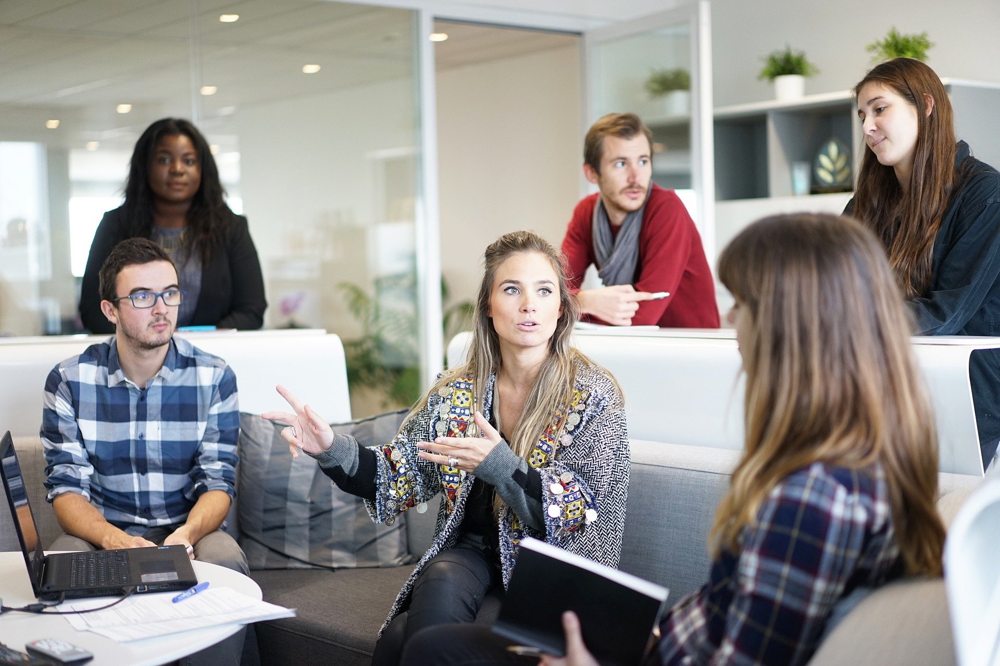

In [9]:
# 이미지 파일 입력 및 확인
filename = "people3.jpg"
image = "/content/drive/My Drive/Colab Notebooks/★Dataset★/" + filename
frame = cv2.imread(image)
cv2_imshow(frame)

# point_num에는 5개 또는 68개의 랜드마크 데이터 지정
point_num = 5  # 5 or 68
predictor_path = f"/content/drive/My Drive/Colab Notebooks/dlib-models/shape_predictor_{point_num}_face_landmarks.dat"


##<strong> 2. 얼굴 검출 tool 생성 </strong>


In [10]:
# dlib에 있는 정면 얼굴 검출 메소드
detector = dlib.get_frontal_face_detector() 

# 인식된 얼굴에서 랜드마크를 찾기 위한 클래스 생성
predictor = dlib.shape_predictor(predictor_path)

# 입력 사진에서 얼굴을 검출하여 faces로 반환
faces = detector(frame)

##<strong> 3. 결과 보기 </strong>


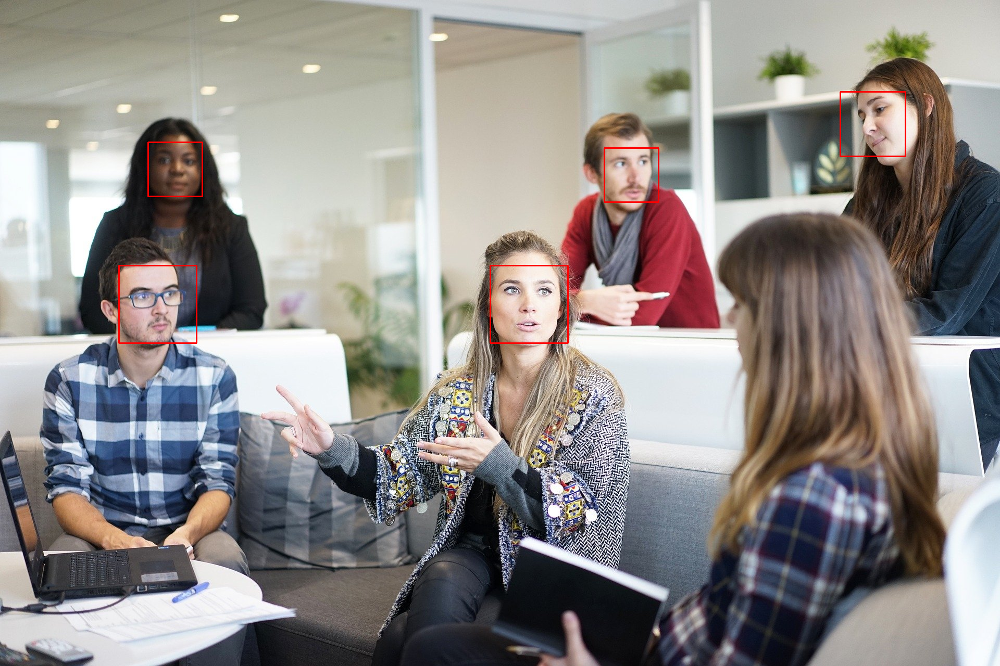

In [11]:
check_img = frame.copy()


# 얼굴로 예상되는 부분을 바운딩 박스로 그림
for face in faces:
  x1, y1, x2, y2 = face.left(), face.top(), face.right(), face.bottom()

  # 왼쪽 상단의 좌표와 오른쪽 하단의 좌표로 얼굴을 감싸는 사각형을 그림
  # cv2.rectangle(img, start, end, color, thickness)
  # img -> 입력 영상
  # start -> 시작 좌표
  # end -> 종료 좌표
  # color -> BGR형태의 컬러
  # thickness -> 선의 두꼐
  cv2.rectangle(check_img, (x1, y1), (x2, y2), (0,0,255), thickness=2)


cv2_imshow(check_img)

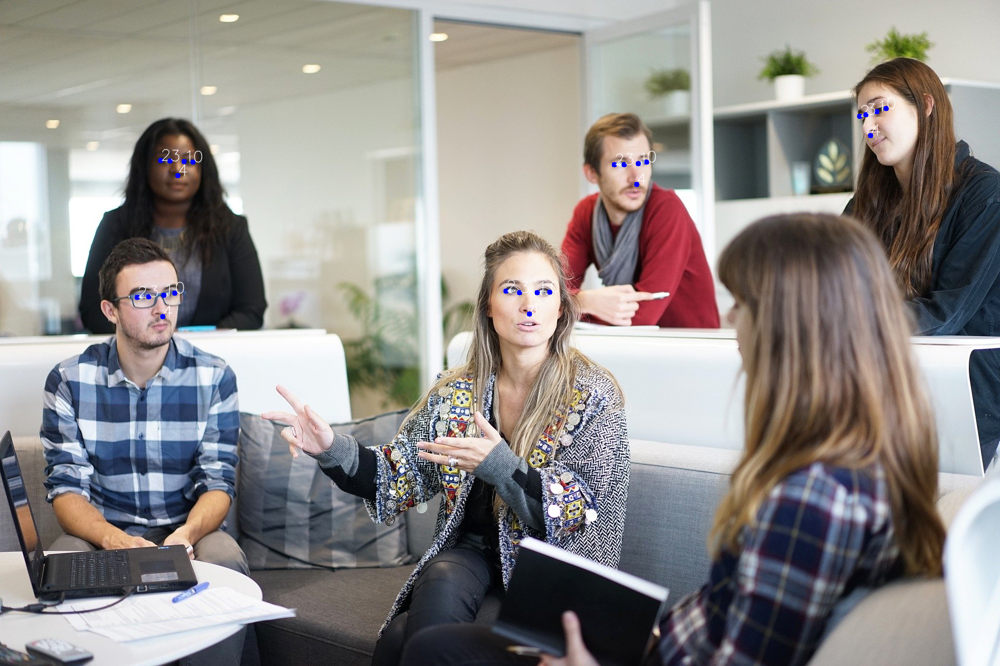

In [12]:
check_img = frame.copy()


# 얼굴 내 랜드마크로 예상되는 부분에 point_num개의 점을 찍음
if len(faces):
  for face in faces:
    landmarks = predictor(check_img, face)
    for n in range(0, point_num):
      # 각 랜드마크의 x, y 좌표를 찾아냄
      x = landmarks.part(n).x
      y = landmarks.part(n).y

      # 원을 그림
      # cv2.circle(img, center, radian, color, thickness)
      # img -> 입력 영상
      # center -> 원의 중심 좌표(x,y)
      # radian -> 반지름
      # color -> BGR 형태의 컬러
      # thickness -> 선의 두께, -1 이면 원 안쪽을 채움
      cv2.circle(check_img, (x, y), 5, (255,0,0), -1)

      # 텍스트를 입력
      # cv2.putText(img, text, org, font, fontSacle, color)
      # img -> 입력 영상
      # text -> 표시할 문자열
      # org -> 문자열이 표시될 위치
      # font -> 폰트 종류
      # fontSacle -> 폰트 크기
      # color -> 폰트 색상
      cv2.putText(check_img, str(n), (x,y), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 1, cv2.LINE_AA)


cv2_imshow(check_img)

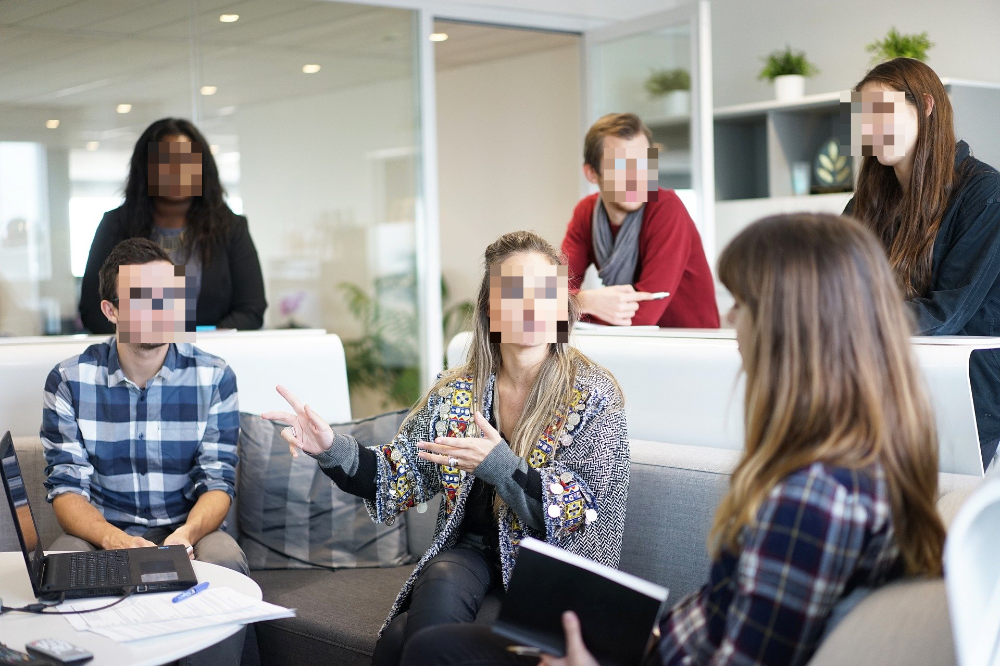

In [13]:
check_img = frame.copy()


# 얼굴로 예상되는 부분을 모자이크
if len(faces):
  for face in faces:
    x1, y1, x2, y2 = face.left(), face.top(), face.right(), face.bottom()
    ROI = check_img[y1:y2, x1:x2]
    # cv2.resize(img, dsize, fx, fy, interpolation)
    # img -> 입력 영상
    # dsize -> 절대 크기. 가로, 세로 형태의 튜플
    # fx -> 가로 사이즈의 배수
    # fy -> 세로 사이즈의 배수
    # interpolation -> 보간법
    shrink = cv2.resize(ROI, None, fx=0.05, fy=0.05)
    zoom = cv2.resize(shrink, (x2-x1, y2-y1), interpolation=cv2.INTER_AREA)
    check_img[y1:y2, x1:x2] = zoom


cv2_imshow(check_img)